# Topic Model


## Dataset

In [1]:
import data
import importlib
importlib.reload(data)
from data import DataLoader

/local/alex/miniconda3/envs/at2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[nltk_data] Downloading package punkt to /home/alex/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt to /home/alex/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


### Load Data
### Preprocess Data and Covert to OCTIS-format

In [ ]:
dataloader = DataLoader(dataset="tiktok")
dataloader.load_docs(path="tiktok.txt")
dataloader.preprocess_to_octis(output_folder="tiktok")

In [ ]:
import string
from octis.preprocessing.preprocessing import Preprocessing

preprocessor = Preprocessing(
                lowercase=True,
                remove_punctuation=True,            # Save some words
                punctuation=string.punctuation,
                remove_numbers=True,
                lemmatize=True,
                language="english",
                split=False,
                verbose=True,
                save_original_indexes=True,
                remove_stopwords_spacy=True,
            )

dataloader.preprocess_to_octis(output_folder=f"tiktok_{max_rows}_preprocess",preprocessor=preprocessor)

## Model Training 

In [3]:
import evaluation
import importlib
importlib.reload(evaluation)
from evaluation import Trainer
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

### LDA

In [ ]:
dataset, custom = "tiktok_preprocess", True
params = {"num_topics": 40}

trainer = Trainer(dataset=dataset,
                    model_name="LDA",
                    params=params,
                    custom_dataset=custom,
                    verbose=True)
results = trainer.train(save=f"result/LDA")

### NMF

In [ ]:
dataset, custom = "tiktok_preprocess", True
params = {}

trainer = Trainer(dataset=dataset,
                    model_name="NMF",
                    params=params,
                    custom_dataset=custom,
                    verbose=True)
results = trainer.train(save=f"result/NMF")

### ETM

In [ ]:
dataset, custom = "tiktok_preprocess", True
params = {"num_topics": 40}

trainer = Trainer(dataset=dataset,
                    model_name="ETM",
                    params=params,
                    custom_dataset=custom,
                    verbose=True)
results = trainer.train(save=f"result/ETM_40")

### CTM

In [ ]:
dataset, custom = "tiktok_preprocess", True
params = {"num_topics": 40}

trainer = Trainer(dataset=dataset,
                    model_name="CTM",
                    params=params,
                    custom_dataset=custom,
                    verbose=True)
results = trainer.train(save=f"result/CTM")

### BERTopic

In [4]:
from sentence_transformers import SentenceTransformer

# Prepare data
dataset, custom = "tiktok", True
data_loader = DataLoader(dataset)
data = data_loader.access(custom)
data = [" ".join(words) for words in data.get_corpus()]

# Extract embeddings
embedding_model = SentenceTransformer("all-mpnet-base-v2", trust_remote_code=True)
embeddings = embedding_model.encode(data, show_progress_bar=True)

Batches: 100%|██████████| 3125/3125 [00:50<00:00, 61.69it/s] 


Vanilla BERTopic.

params = {
    "embedding_model": "all-mpnet-base-v2",
    "verbose": True,
    "random_state" : 87,
}

trainer = Trainer(dataset=dataset,
                    model_name="BERTopic",
                    params=params,
                    embeddings=embeddings,
                    custom_dataset=custom,
                    verbose=True)
results = trainer.train(save=f"BERTopic_tiktok_small_vanilla")
    

Fine-tuned BERTopic. 

Control the number of topics, adjust pipeline algorithm parameters, post-process the data.

In [44]:
#from cuml.manifold import UMAP
#from cuml.cluster import HDBSCAN
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.vectorizers import ClassTfidfTransformer
from bertopic.representation import MaximalMarginalRelevance, KeyBERTInspired, PartOfSpeech


#for i in range(1, 4):
top_n_words, nr_topics = 100, None
n_neighbors, n_components, min_dist = 15, 5, 0.0
min_cluster_size = 200
ngram, min_df, max_df = 1, 0.0, 1.0
c, r = 1, 2

umap_model = UMAP(n_neighbors=n_neighbors, n_components=n_components, min_dist=min_dist, metric='cosine', random_state=87)
hdbscan_model = HDBSCAN(min_cluster_size=min_cluster_size, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
vectorizer_model = CountVectorizer(stop_words="english", ngram_range=(1,ngram), min_df=min_df, max_df=max_df)
ctfidf_model = ClassTfidfTransformer(reduce_frequent_words=True)
representation_model = MaximalMarginalRelevance(diversity=0.3, top_n_words=top_n_words) #(recommended)
params = {
    "verbose": True,
    "embedding_model": embedding_model,
    "umap_model": umap_model,                   
    "hdbscan_model": hdbscan_model,              
    "vectorizer_model": vectorizer_model, 
    "top_n_words": top_n_words,
    "nr_topics": nr_topics,
}

if c>0:
    params["ctfidf_model"] = ctfidf_model
if r>0:
    params["representation_model"] = representation_model
    

trainer = Trainer(dataset=dataset,
                    custom_dataset=custom,
                    model_name="BERTopic",
                    params=params,
                    embeddings=embeddings,
                    verbose=True,
                    #verbose_coherence=True,
                    )

results = trainer.train(save=f"result/{top_n_words}-{nr_topics}_{n_neighbors}-{n_components}-{min_dist}-{min_cluster_size}_{ngram}-{min_df}{max_df}_{c}-{r}")



2024-07-22 17:41:32,152 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-07-22 17:42:36,760 - BERTopic - Dimensionality - Completed ✓
2024-07-22 17:42:36,761 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-07-22 17:42:42,915 - BERTopic - Cluster - Completed ✓
2024-07-22 17:42:42,923 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-07-22 17:42:47,780 - BERTopic - Representation - Completed ✓


Topics: 
0: tiktok | thank | team | thanks | account | tiktoker | life | viral | day | happy
1: platform | entertaining | addictive | informative | way | place | laugh | educational | content | funny
2: video | videos | watch | vids | making | short | upload | make | watching | post
3: vids | videos | watching | funny | watch | short | clips | making | video | make
4: nice | recommend | awesome | words | use | download | amazing | enjoyed | using | say
5: meet | friends | connect | express | talk | met | new | communicate | feelings | people
6: dance | dances | dancing | lip | sing | learn | singing | sync | moves | songs
7: addicted | bored | addictive | addicting | hours | spend | boredom | lol | keeps | warning
8: followers | live | 1000 | following | follow | 1k | fans | likes | follower | fast
9: kids | children | age | 13 | ages | 12 | younger | kid | child | inappropriate
10: laugh | depression | mood | makes | smile | sad | laughing | anxiety | helped | funny
11: musically | ly

### Top2Vec

In [ ]:
import logging
import numpy as np
import pandas as pd
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import strip_tags
import umap
import hdbscan
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from joblib import dump, load
from sklearn.cluster import dbscan
import tempfile
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.preprocessing import normalize
from scipy.special import softmax
from top2vec import Top2Vec


import hnswlib
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text


from sentence_transformers import SentenceTransformer

logger = logging.getLogger('top2vec')
logger.setLevel(logging.WARNING)
sh = logging.StreamHandler()
sh.setFormatter(logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s'))
logger.addHandler(sh)


def default_tokenizer(doc):
    """Tokenize documents for training and remove too long/short words"""
    return simple_preprocess(strip_tags(doc), deacc=True)


class Top2VecNew(Top2Vec):
    def __init__(self,
                 documents,
                 min_count=50,
                 embedding_model='doc2vec',
                 embedding_model_path=None,
                 speed='learn',
                 use_corpus_file=False,
                 document_ids=None,
                 keep_documents=True,
                 workers=None,
                 tokenizer=None,
                 use_embedding_model_tokenizer=False,
                 umap_args=None,
                 hdbscan_args=None,
                 verbose=True
                 ):

        if verbose:
            logger.setLevel(logging.DEBUG)
            self.verbose = True
        else:
            logger.setLevel(logging.WARNING)
            self.verbose = False

        if tokenizer is None:
            tokenizer = default_tokenizer

        # validate documents
        if not (isinstance(documents, list) or isinstance(documents, np.ndarray)):
            raise ValueError("Documents need to be a list of strings")
        if not all((isinstance(doc, str) or isinstance(doc, np.str_)) for doc in documents):
            raise ValueError("Documents need to be a list of strings")
        if keep_documents:
            self.documents = np.array(documents, dtype="object")
        else:
            self.documents = None

        # validate document ids
        if document_ids is not None:
            if not (isinstance(document_ids, list) or isinstance(document_ids, np.ndarray)):
                raise ValueError("Documents ids need to be a list of str or int")

            if len(documents) != len(document_ids):
                raise ValueError("Document ids need to match number of documents")
            elif len(document_ids) != len(set(document_ids)):
                raise ValueError("Document ids need to be unique")

            if all((isinstance(doc_id, str) or isinstance(doc_id, np.str_)) for doc_id in document_ids):
                self.doc_id_type = np.str_
            elif all((isinstance(doc_id, int) or isinstance(doc_id, np.int_)) for doc_id in document_ids):
                self.doc_id_type = np.int_
            else:
                raise ValueError("Document ids need to be str or int")

            self.document_ids_provided = True
            self.document_ids = np.array(document_ids)
            self.doc_id2index = dict(zip(document_ids, list(range(0, len(document_ids)))))
        else:
            self.document_ids_provided = False
            self.document_ids = np.array(range(0, len(documents)))
            self.doc_id2index = dict(zip(self.document_ids, list(range(0, len(self.document_ids)))))
            self.doc_id_type = np.int_

        acceptable_embedding_models = ["universal-sentence-encoder-multilingual",
                                       "universal-sentence-encoder",
                                       "all-mpnet-base-v2"]

        self.embedding_model_path = embedding_model_path

        if embedding_model == 'doc2vec':

            # validate training inputs
            if speed == "fast-learn":
                hs = 0
                negative = 5
                epochs = 40
            elif speed == "learn":
                hs = 1
                negative = 0
                epochs = 40
            elif speed == "deep-learn":
                hs = 1
                negative = 0
                epochs = 400
            elif speed == "test-learn":
                hs = 0
                negative = 5
                epochs = 1
            else:
                raise ValueError("speed parameter needs to be one of: fast-learn, learn or deep-learn")

            if workers is None:
                pass
            elif isinstance(workers, int):
                pass
            else:
                raise ValueError("workers needs to be an int")

            doc2vec_args = {"vector_size": 300,
                            "min_count": min_count,
                            "window": 15,
                            "sample": 1e-5,
                            "negative": negative,
                            "hs": hs,
                            "epochs": epochs,
                            "dm": 0,
                            "dbow_words": 1}

            if workers is not None:
                doc2vec_args["workers"] = workers

            logger.info('Pre-processing documents for training')

            if use_corpus_file:
                processed = [' '.join(tokenizer(doc)) for doc in documents]
                lines = "\n".join(processed)
                temp = tempfile.NamedTemporaryFile(mode='w+t')
                temp.write(lines)
                doc2vec_args["corpus_file"] = temp.name


            else:
                train_corpus = [TaggedDocument(tokenizer(doc), [i]) for i, doc in enumerate(documents)]
                doc2vec_args["documents"] = train_corpus

            logger.info('Creating joint document/word embedding')
            self.embedding_model = 'doc2vec'
            self.model = Doc2Vec(**doc2vec_args)

            if use_corpus_file:
                temp.close()

        elif embedding_model in acceptable_embedding_models:

            self.embed = None
            self.embedding_model = embedding_model

            self._check_import_status()

            logger.info('Pre-processing documents for training')

            # preprocess documents
            tokenized_corpus = [tokenizer(doc) for doc in documents]

            def return_doc(doc):
                return doc

            # preprocess vocabulary
            vectorizer = CountVectorizer(tokenizer=return_doc, preprocessor=return_doc)
            doc_word_counts = vectorizer.fit_transform(tokenized_corpus)
            words = vectorizer.get_feature_names()
            word_counts = np.array(np.sum(doc_word_counts, axis=0).tolist()[0])
            vocab_inds = np.where(word_counts > min_count)[0]

            if len(vocab_inds) == 0:
                raise ValueError(f"A min_count of {min_count} results in "
                                 f"all words being ignored, choose a lower value.")
            self.vocab = [words[ind] for ind in vocab_inds]

            self._check_model_status()

            logger.info('Creating joint document/word embedding')

            # embed words
            self.word_indexes = dict(zip(self.vocab, range(len(self.vocab))))
            self.word_vectors = self._l2_normalize(np.array(self.embed(self.vocab)))

            # embed documents
            if use_embedding_model_tokenizer:
                self.document_vectors = self._embed_documents(documents)
            else:
                train_corpus = [' '.join(tokens) for tokens in tokenized_corpus]
                self.document_vectors = self._embed_documents(train_corpus)

        else:
            raise ValueError(f"{embedding_model} is an invalid embedding model.")


        if umap_args is None:
            umap_args = {'n_neighbors': 15,
                         'n_components': 5,
                         'metric': 'cosine'}

        umap_model = umap.UMAP(**umap_args).fit(self._get_document_vectors(norm=False))


        if hdbscan_args is None:
            hdbscan_args = {'min_cluster_size': 15,
                            'metric': 'euclidean',
                            'cluster_selection_method': 'eom'}

        cluster = hdbscan.HDBSCAN(**hdbscan_args).fit(umap_model.embedding_)

        # create topic vectors
        self._create_topic_vectors(cluster.labels_)

        # deduplicate topics
        self._deduplicate_topics()

        # find topic words and scores
        self.topic_words, self.topic_word_scores = self._find_topic_words_and_scores(topic_vectors=self.topic_vectors)

        # assign documents to topic
        self.doc_top, self.doc_dist = self._calculate_documents_topic(self.topic_vectors,
                                                                      self._get_document_vectors())

        # calculate topic sizes
        self.topic_sizes = self._calculate_topic_sizes(hierarchy=False)

        # re-order topics
        self._reorder_topics(hierarchy=False)

        # initialize variables for hierarchical topic reduction
        self.topic_vectors_reduced = None
        self.doc_top_reduced = None
        self.doc_dist_reduced = None
        self.topic_sizes_reduced = None
        self.topic_words_reduced = None
        self.topic_word_scores_reduced = None
        self.hierarchy = None

        # initialize document indexing variables
        self.document_index = None
        self.serialized_document_index = None
        self.documents_indexed = False
        self.index_id2doc_id = None
        self.doc_id2index_id = None

        # initialize word indexing variables
        self.word_index = None
        self.serialized_word_index = None
        self.words_indexed = False

    def _check_import_status(self):
        pass

    def _check_model_status(self):
        if self.embed is None:
            if self.verbose is False:
                logger.setLevel(logging.DEBUG)

            if self.embedding_model != "all-mpnet-base-v2":
                if self.embedding_model_path is None:
                    logger.info(f'Downloading {self.embedding_model} model')
                    if self.embedding_model == "universal-sentence-encoder-multilingual":
                        module = "https://tfhub.dev/google/universal-sentence-encoder-multilingual/3"
                    else:
                        module = "https://tfhub.dev/google/universal-sentence-encoder/4"
                else:
                    logger.info(f'Loading {self.embedding_model} model at {self.embedding_model_path}')
                    module = self.embedding_model_path
                self.embed = hub.load(module)

            else:
                if self.embedding_model_path is None:
                    logger.info(f'Downloading {self.embedding_model} model')
                    module = 'all-mpnet-base-v2'
                else:
                    logger.info(f'Loading {self.embedding_model} model at {self.embedding_model_path}')
                    module = self.embedding_model_path
                model = SentenceTransformer(module)
                self.embed = model.encode

        if self.verbose is False:
            logger.setLevel(logging.WARNING)

In [ ]:
dataset, custom = "tiktok", True
params = {"nr_topics": [(i+1)*10 for i in range(5)],
            # "embedding_model": "all-mpnet-base-v2",
            "hdbscan_args": {'min_cluster_size': 15,
                            'metric': 'euclidean',
                            'cluster_selection_method': 'eom'}}

trainer = Trainer(dataset=dataset,
                    custom_dataset=custom,
                    custom_model=Top2VecNew,
                    model_name="Top2Vec",
                    params=params,
                    verbose=True)
results = trainer.train(save=f"Top2Vec_tiktok")

In [23]:
trainer.bertopic_model.get_topic_info().to_csv("topic_info.csv")

TypeError: Make sure that the documents variable is an iterable containing strings only.

In [17]:
data = trainer.data.get_corpus()
data = [" ".join(words) for words in data]
trainer.bertopic_model.visualize_documents(docs=data,embeddings=trainer.embeddings, hide_annotations=True, hide_document_hover=True, title="optimal", width=900, height=600)

In [14]:
trainer.bertopic_model.visualize_heatmap(title="")

In [16]:
trainer.bertopic_model.visualize_hierarchy(title="")

In [33]:
trainer.bertopic_model.get_topic(1)

[('fun entertaining', 0.56700635),
 ('addicting', 0.486345),
 ('entertaining educational', 0.48166597),
 ('pass time', 0.47437575),
 ('addictive', 0.46394014),
 ('really fun', 0.45577902),
 ('having fun', 0.45492426),
 ('fun', 0.44863695),
 ('fun great', 0.43910554),
 ('fun informative', 0.43316495),
 ('great fun', 0.4330399),
 ('love fun', 0.43200302),
 ('lot fun', 0.42930007),
 ('entertaining', 0.425245),
 ('funny fun', 0.42500764),
 ('funny entertaining', 0.42438772),
 ('fun good', 0.42020664),
 ('good fun', 0.4032282),
 ('fun fun', 0.37883678),
 ('fun funny', 0.36997187),
 ('new friends', 0.36189064),
 ('fun way', 0.34931186),
 ('entertainment', 0.34372336),
 ('bored', 0.33376777),
 ('fun watch', 0.32688007),
 ('informative', 0.31823644),
 ('great place', 0.31377107),
 ('great platform', 0.31239834),
 ('new people', 0.31086883),
 ('social', 0.29011875),
 ('social media', 0.286242),
 ('friends', 0.28001276),
 ('people', 0.27636287),
 ('community', 0.2653541),
 ('life', 0.2611379),
 

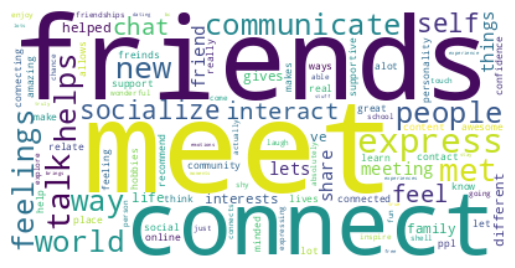

In [52]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(trainer.bertopic_model, topic=5)
